In [12]:
%matplotlib inline
%load_ext autoreload
%autoreload 2

from os.path import join as pjoin
from glob import glob
import numpy as np

from matplotlib import pyplot as plt
import matplotlib as mpl
mpl.rcParams['figure.figsize'] = (16,8)
mpl.rcParams['image.cmap'] = 'inferno'

import cv2
print('OpenCV version used:', cv2.__version__)
from utils import imread, imshow

import sys
sys.path.append("../Camera-Calibration")
from calibrate import Calibrator
from mvg import run, run_opencv
from utils import drawpts, drawlines, normalize2dpts, hom

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload
OpenCV version used: 3.4.2


In [2]:
calib6s = Calibrator('../Camera-Calibration/data/iphone6s', ext='JPG', chessboard_shape=(6,9))
calib6s.run()
calib6s.remove_recalibrate(27)
calib6s.remove_recalibrate(11)

../Camera-Calibration/data/iphone6s/IMG_2789.JPG: corners found.
../Camera-Calibration/data/iphone6s/IMG_2791.JPG: corners found.
../Camera-Calibration/data/iphone6s/IMG_2792.JPG: corners found.
../Camera-Calibration/data/iphone6s/IMG_2793.JPG: corners found.
../Camera-Calibration/data/iphone6s/IMG_2806.JPG: corners found.
../Camera-Calibration/data/iphone6s/IMG_2808.JPG: corners found.
../Camera-Calibration/data/iphone6s/IMG_2809.JPG: corners found.
../Camera-Calibration/data/iphone6s/IMG_2810.JPG: corners found.
../Camera-Calibration/data/iphone6s/IMG_2812.JPG: corners found.
../Camera-Calibration/data/iphone6s/IMG_2813.JPG: corners found.
../Camera-Calibration/data/iphone6s/IMG_2815.JPG: corners found.
../Camera-Calibration/data/iphone6s/IMG_2817.JPG: corners found.
../Camera-Calibration/data/iphone6s/IMG_2818.JPG: corners found.
../Camera-Calibration/data/iphone6s/IMG_2819.JPG: corners found.
../Camera-Calibration/data/iphone6s/IMG_2823.JPG: corners found.
../Camera-Calibration/dat

Pair 1
Custom implementation result:


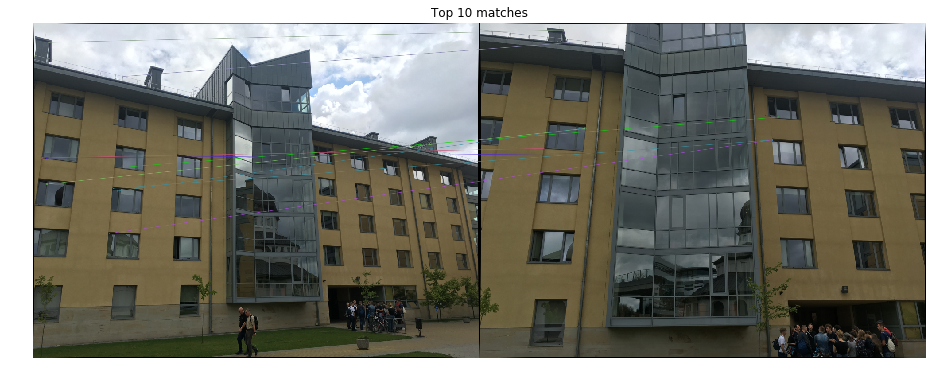

Fundamental matrix:
 [[-4.64508952e-06  3.93560962e-07  2.51183141e-03]
 [-7.59909896e-06 -4.61722962e-06  5.28713004e-03]
 [ 4.53341460e-03  1.25248123e-03 -2.81786247e+00]]


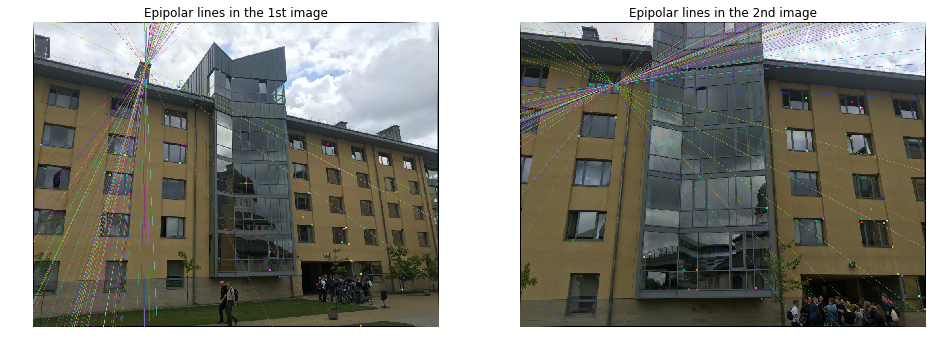

OpenCV result:
Fundamental matrix:
 [[-5.21788383e-05  4.92558116e-06 -5.83926548e-03]
 [ 5.85488161e-04 -2.05600387e-05  7.41939017e-03]
 [-4.16147603e-01  1.08658079e-02  1.00000000e+00]]


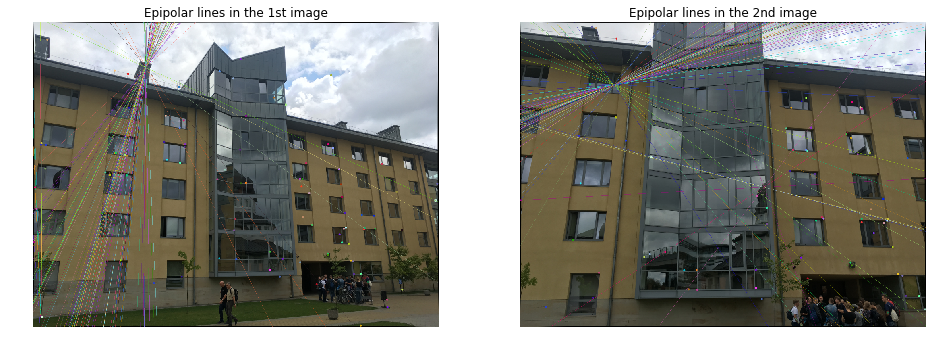

Pair 2
Custom implementation result:


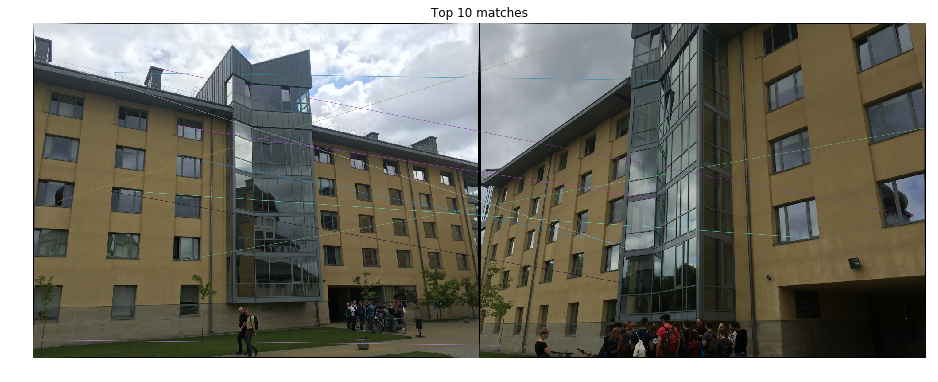

Fundamental matrix:
 [[ 2.71879300e-07  2.30162739e-06 -1.80027268e-03]
 [ 2.42404467e-06 -4.84726392e-06  1.52003052e-03]
 [-1.23831260e-03  2.30448959e-03 -6.57565325e-01]]


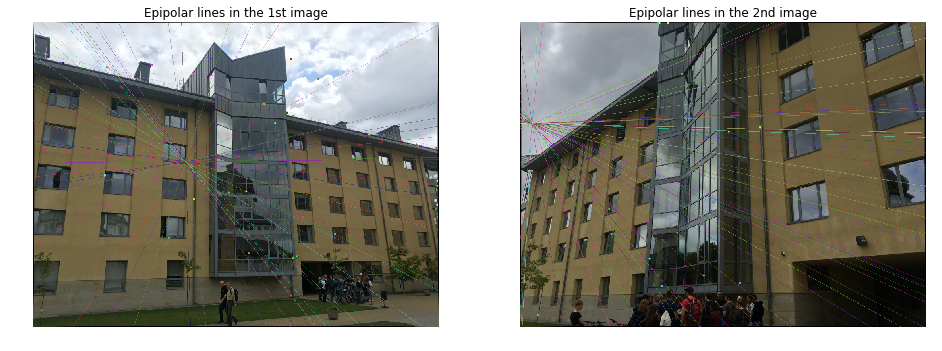

OpenCV result:
Fundamental matrix:
 [[-3.05567324e-05 -7.31634613e-06 -6.10208263e-03]
 [-7.70311884e-04 -1.62126751e-05  2.30555801e-02]
 [ 2.92365286e-01  1.54266902e-02  1.00000000e+00]]


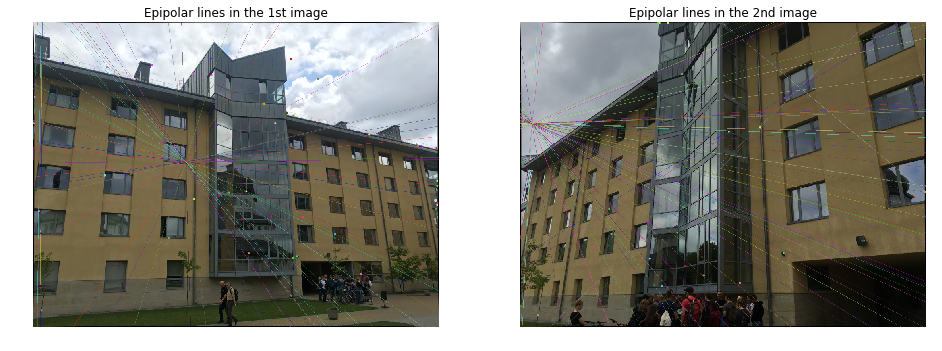

Pair 3
Custom implementation result:


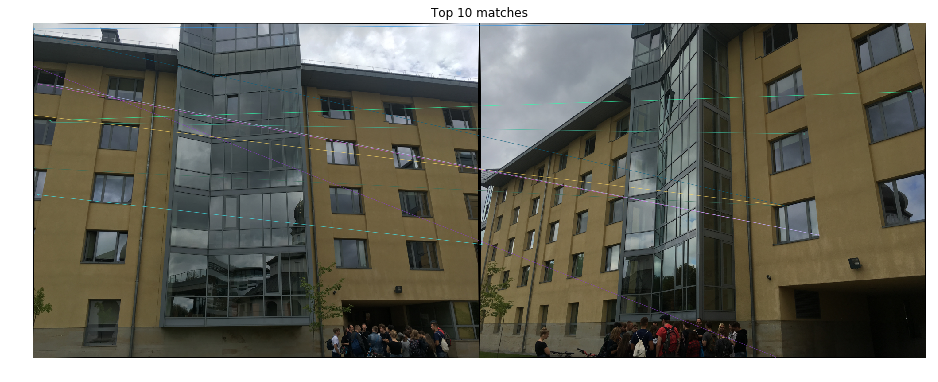

Fundamental matrix:
 [[-1.21972682e-06  5.37400758e-07 -1.39489078e-04]
 [ 1.76696833e-05  6.52078900e-06 -3.44147709e-03]
 [-1.22956306e-02 -4.35281833e-03  2.32425089e+00]]


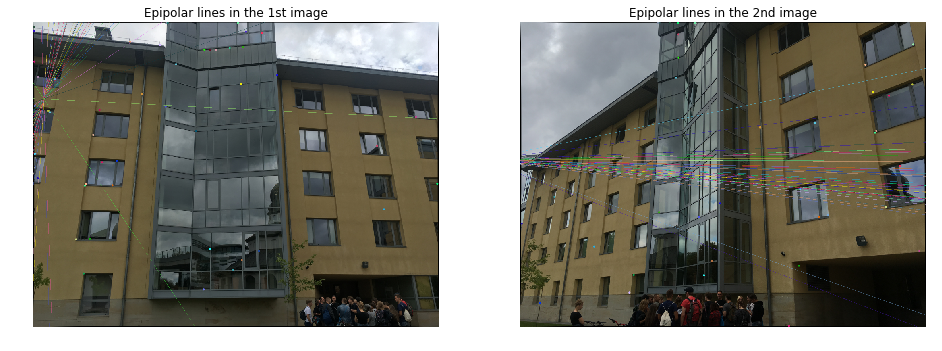

OpenCV result:
Fundamental matrix:
 [[-2.05398560e-05  3.56406917e-06 -3.92859864e-03]
 [ 1.80443175e-04 -7.66360332e-06  1.22011646e-03]
 [-1.35959479e-01  4.41109436e-03  1.00000000e+00]]


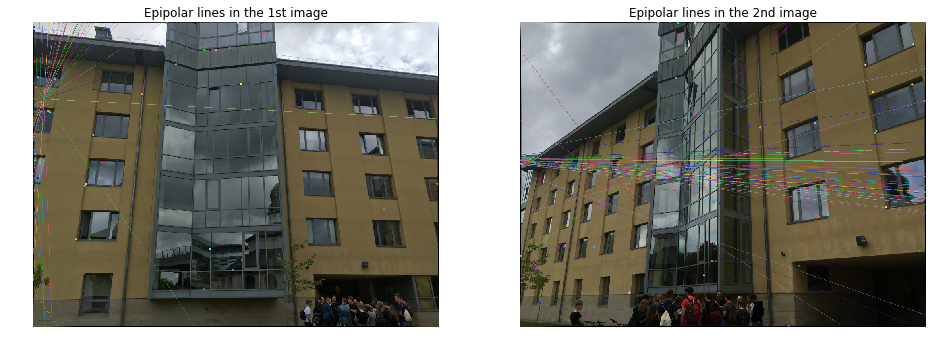

In [13]:
datadir = 'data/iphone6s/dorm'
ext = 'JPG'
imgpaths = sorted(glob(datadir + '/*.' + ext))


from itertools import combinations

for i, pair in enumerate(combinations(imgpaths, 2)):
    print('Pair {}'.format(i+1))
    img1 = calib6s.undistort(imread(pair[0]))
    img2 = calib6s.undistort(imread(pair[1]))
    
    f = 0.5
    img1 = cv2.resize(img1, None, fx=f, fy=f)
    img2 = cv2.resize(img2, None, fx=f, fy=f)
    
    N = 10
    
    print('Custom implementation result:')
    run(img1, img2, N=N)
    
    print('OpenCV result:')
    run_opencv(img1, img2, N=N)

Pair 1
Custom implementation result:


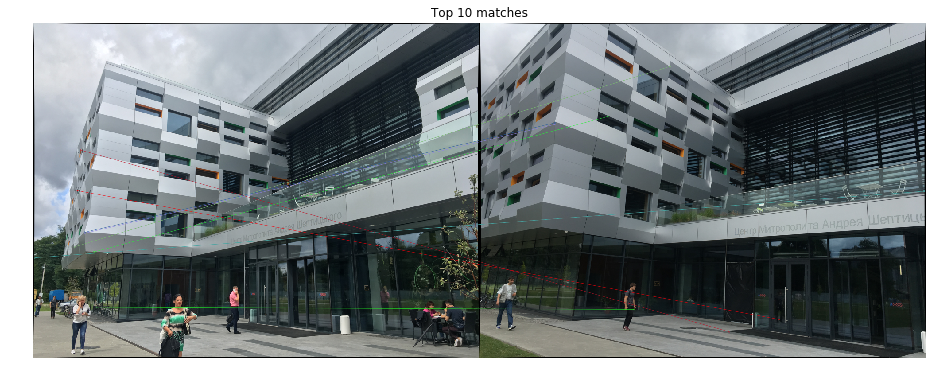

Fundamental matrix:
 [[ 4.87917361e-07  3.37320111e-06 -1.89818497e-03]
 [ 2.78827059e-06 -2.55530922e-06  2.79136903e-03]
 [-4.11990474e-03  3.19956572e-04 -1.96562613e+00]]


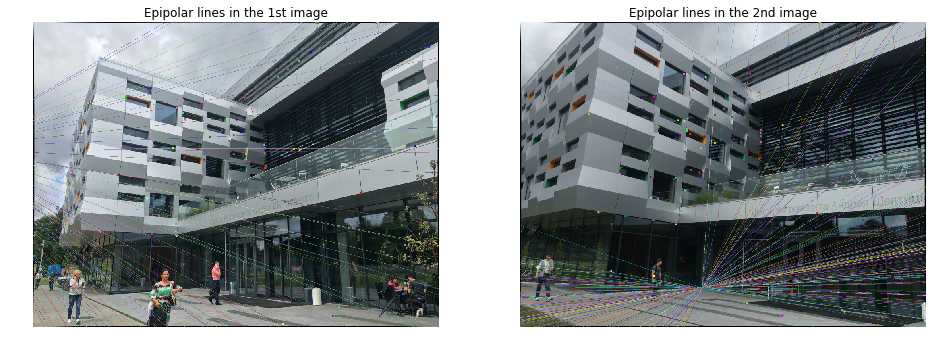

OpenCV result:
Fundamental matrix:
 [[ 1.66656411e-04  2.96606320e-07 -8.39130663e-04]
 [-1.75212073e-04 -4.19563649e-08  7.62163098e-04]
 [-1.93476136e-01 -4.02406218e-04  1.00000000e+00]]


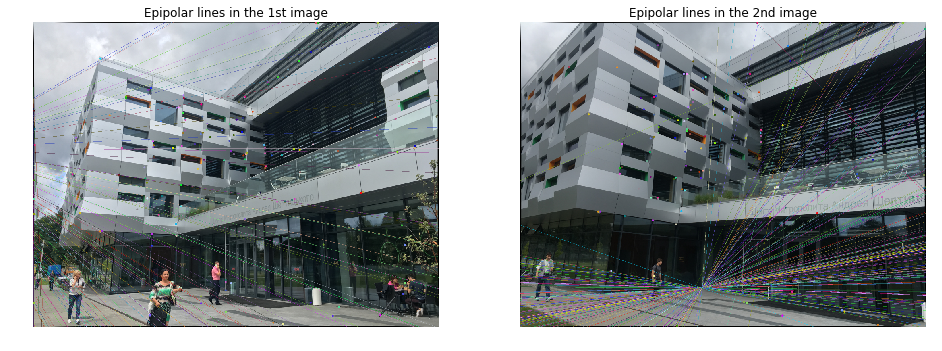

Pair 2
Custom implementation result:


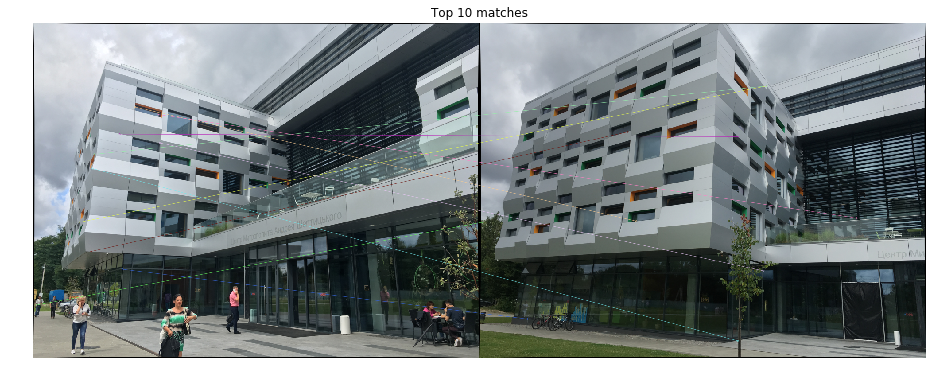

Fundamental matrix:
 [[-2.38075686e-06  3.28886028e-06 -1.50409597e-03]
 [ 5.53658149e-06 -6.40163556e-06  2.23528936e-03]
 [-3.10524573e-03  2.15996023e-03  1.94878297e-01]]


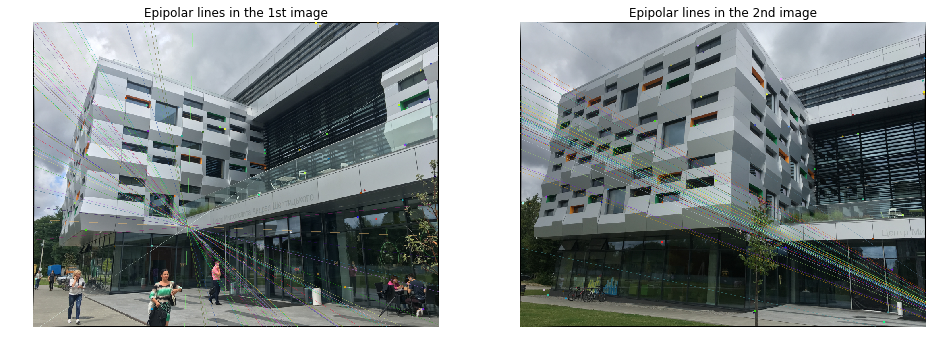

OpenCV result:
Fundamental matrix:
 [[ 1.25427131e-01 -2.41513242e-03 -8.11805498e-01]
 [ 1.53865682e-03  1.90242789e-07 -6.33422854e-03]
 [ 4.58971028e-02  9.78681392e-03  1.00000000e+00]]


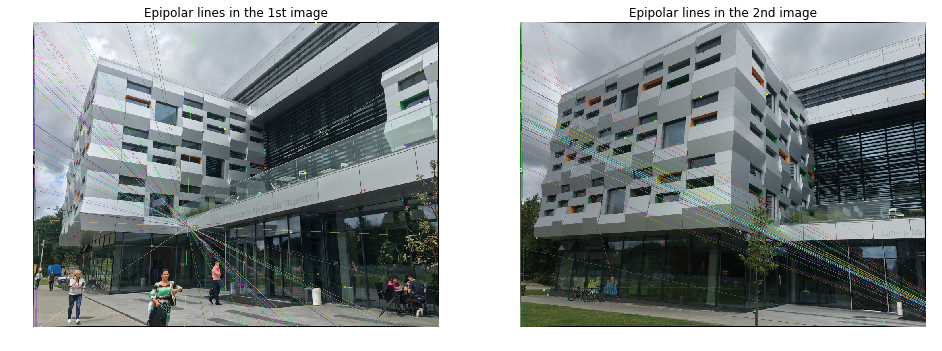

Pair 3
Custom implementation result:


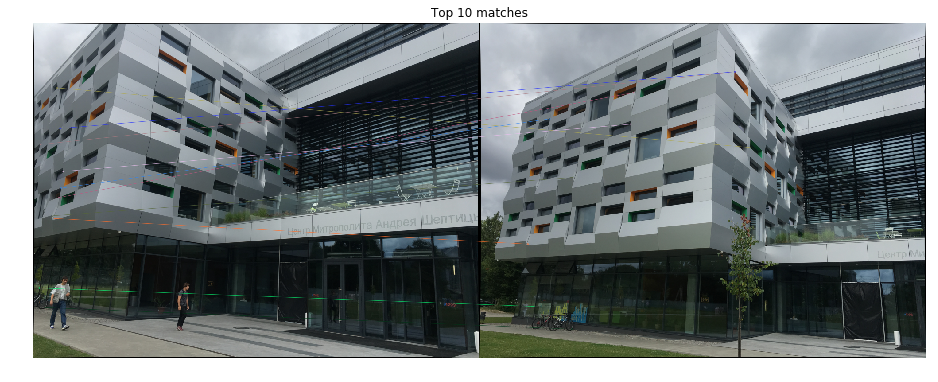

Fundamental matrix:
 [[-3.51340772e-06 -2.07321867e-06  3.09332808e-03]
 [ 1.12205211e-05  4.74164493e-07 -1.49794474e-03]
 [-7.95593361e-03  8.33721516e-04 -5.33012990e-01]]


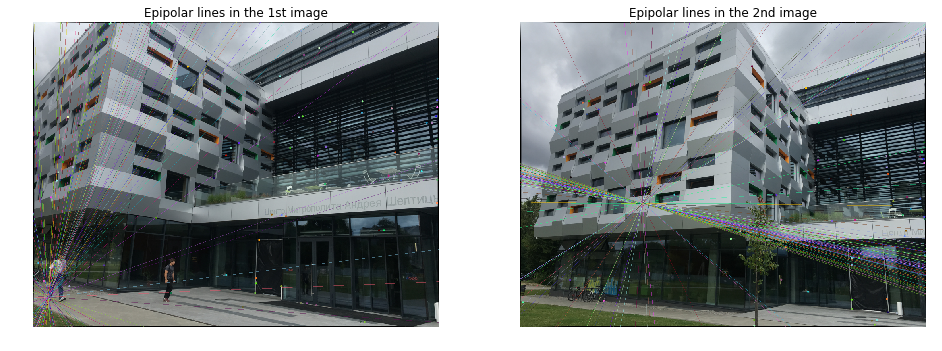

OpenCV result:
Fundamental matrix:
 [[-1.10716126e-04  2.78223053e-06  7.00258044e-04]
 [-1.68705802e-04  8.97521770e-06 -5.41692017e-04]
 [ 2.41731994e-01 -1.35191506e-02  1.00000000e+00]]


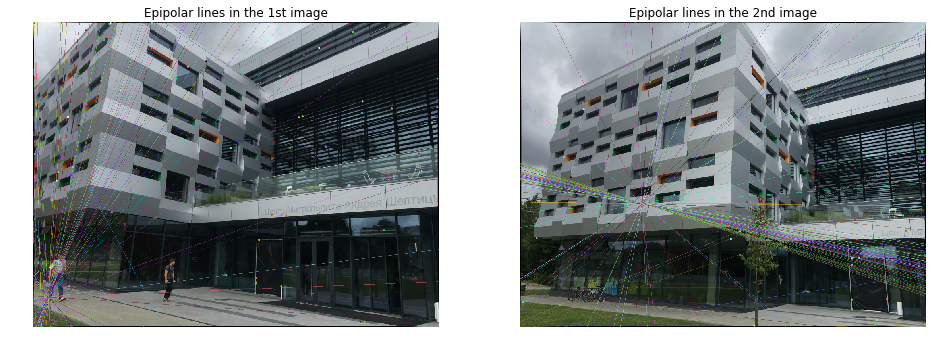

In [14]:
datadir = 'data/iphone6s/library'
ext = 'JPG'
imgpaths = sorted(glob(datadir + '/*.' + ext))


from itertools import combinations

for i, pair in enumerate(combinations(imgpaths, 2)):
    print('Pair {}'.format(i+1))
    img1 = calib6s.undistort(imread(pair[0]))
    img2 = calib6s.undistort(imread(pair[1]))
    
    f = 0.5
    img1 = cv2.resize(img1, None, fx=f, fy=f)
    img2 = cv2.resize(img2, None, fx=f, fy=f)
    
    N = 10
    
    print('Custom implementation result:')
    run(img1, img2, N=N)
    
    print('OpenCV result:')
    run_opencv(img1, img2, N=N)